In [1]:
import sys,warnings
sys.path.append('/share/home/lhlin/workspace/1-EndoAtlas/Reproduce/DevEndo/') # change to the path where devendo.py stript located.
import devendo as de
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import anndata, re,os
import scanpy.external as sce
from scipy.sparse import csr_matrix,csc_matrix, find
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
sc.settings.set_figure_params(dpi=100, facecolor='white')
pd.set_option("display.max_rows", 40)
pd.set_option("display.precision", 2)

In [3]:
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

## 1. Load data

In [ ]:
# STED-EC atlas
adata = sc.read_h5ad('DATA/sted-ec.h5ad')

In [3]:
# Casz1-KO and WT data of E18.5 lung
merge_adata = sc.read('DATA/Casz1_Final.h5ad')

Casz1 expression in STED-EC atlas

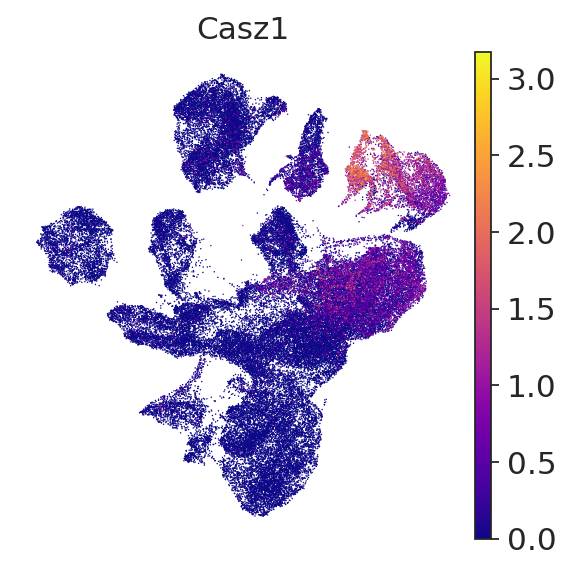

In [163]:
sc.pl.umap(adata, color = 'Casz1', cmap = 'plasma', frameon=False)

In [75]:
merge_adata.obs['condition']

AAACCCAAGTCGCCAC-WT-Batch2      WT
AAACCCAGTGGACTAG-WT-Batch2      WT
AAACCCATCACCTCTG-WT-Batch2      WT
AAACGAAAGAGGACTC-WT-Batch2      WT
AAACGAAAGCCGCACT-WT-Batch2      WT
                              ... 
TTTGATCAGGCATCAG-CKO-Batch1    CKO
TTTGATCGTAGAAACT-CKO-Batch1    CKO
TTTGATCGTTCAAAGA-CKO-Batch1    CKO
TTTGATCTCAAGTTGC-CKO-Batch1    CKO
TTTGGAGGTCTTCCGT-CKO-Batch1    CKO
Name: condition, Length: 14678, dtype: category
Categories (2, object): ['CKO', 'WT']

In [82]:
de.label_cells(merge_adata, annotation = {'WT':'Ctrl'}, key = 'condition',label = 'condition')
merge_adata.obs['condition'] = pd.Categorical(np.array(merge_adata.obs['condition']), ['Ctrl','CKO'])
merge_adata.uns['condition_colors'] = ['#019CCE','#DB4DA5']

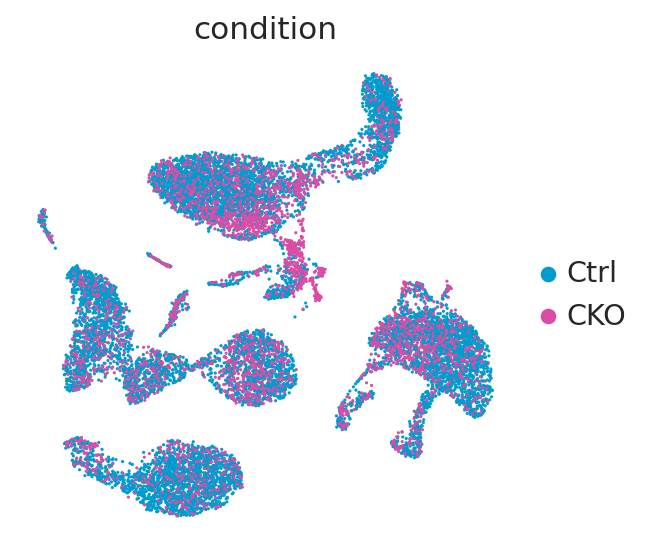

In [7]:
sc.pl.umap(merge_adata, color = ['condition'], cmap = de.mymap,frameon = False,ncols =4)

## 2. Cell types of lung

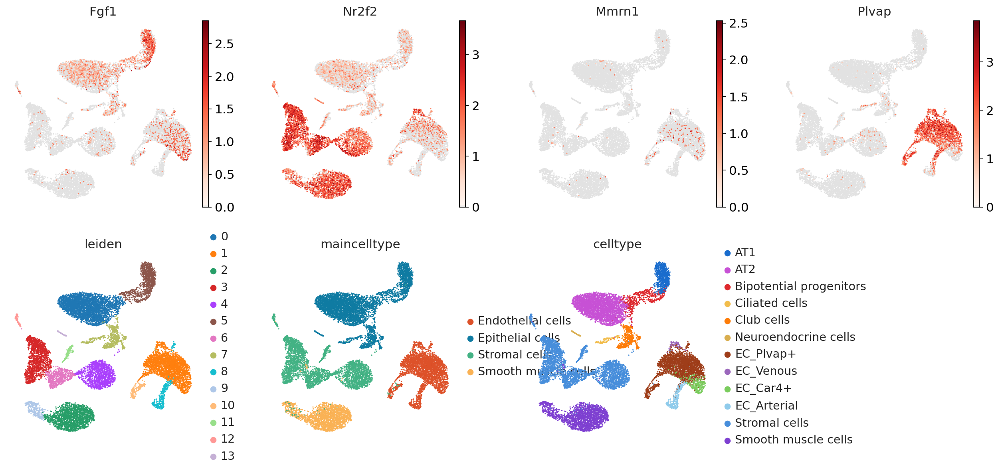

In [59]:
sc.pl.umap(merge_adata, color = ['Fgf1','Nr2f2','Mmrn1','Plvap','leiden', 'maincelltype','celltype'], cmap = de.mymap,
           frameon = False,ncols =4)

Cell type markers

In [41]:
lung_genes = {
    'AT1':['Aqp5','Pdpn','Ager'],
    'AT2':['Sftpb','Sftpc','Sftpd'],
    'Club cells':['Scgb1a1','Scgb3a2','Cyp2f2'],
    'Ciliated cells':['Foxj1', 'Dynlrb2','Myb'],
    'Neuroendocrine cells':['Ascl1','Ptn','Ccn3']
}

In [40]:
merge_adata.obs = de.cat(merge_adata.obs, cats = {'celltype':['Bipotential progenitors',
                                      'AT1',
                                      'AT2',
                                      'Club cells',
                                      'Ciliated cells',
                                      'Neuroendocrine cells']})

In [43]:
epi = merge_adata[merge_adata.obs['maincelltype'] == 'Epithelial cells']

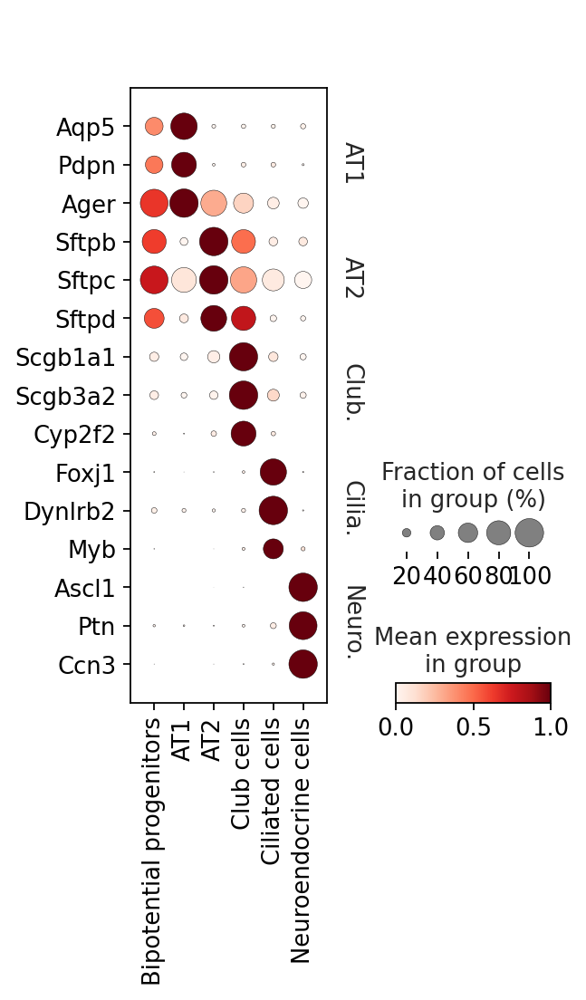

In [45]:
sc.pl.dotplot(epi, lung_genes, "celltype", dendrogram=False,
              standard_scale= 'var',swap_axes = True,save='Fig7_Epithelial_markers.pdf')

Some markers of AT1 cells

In [6]:
epi = merge_adata[merge_adata.obs['maincelltype'] == 'Epithelial cells']

In [8]:
mks = de.FindAllMarkers(epi, 'celltype')

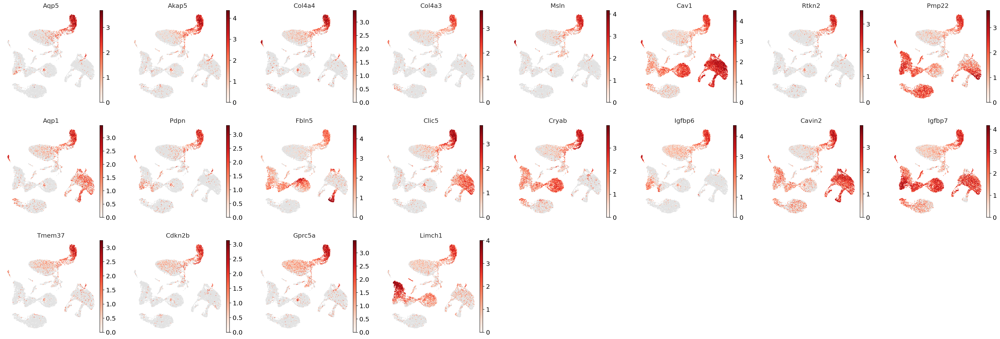

In [12]:
np.random.seed(1)
o = np.random.choice(np.arange(merge_adata.shape[0]), merge_adata.shape[0], replace = False)
sc.pl.umap(merge_adata[o], color = mks[mks['group'] == 'AT1']['names'].tolist()[:20], cmap = de.mymap,frameon = False,ncols =8)

Some markers of club cells

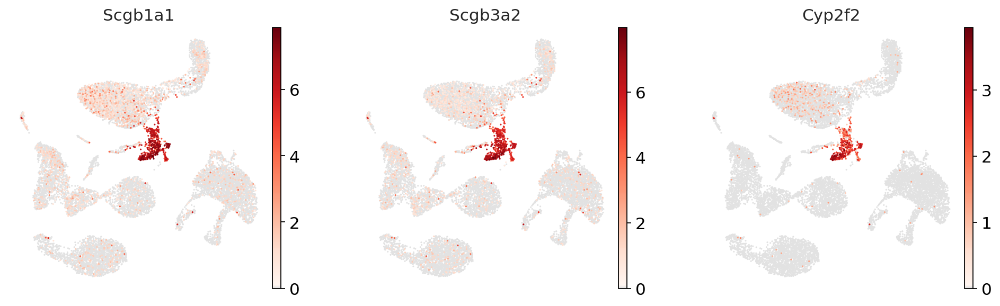

In [27]:
np.random.seed(1)
o = np.random.choice(np.arange(merge_adata.shape[0]), merge_adata.shape[0], replace = False)
sc.pl.umap(merge_adata[o], color = ['Scgb1a1','Scgb3a2','Cyp2f2'], cmap = de.mymap,frameon = False,ncols =8)

Endothelial cells

In [4]:
endo = merge_adata[merge_adata.obs['maincelltype'] == 'Endothelial cells']

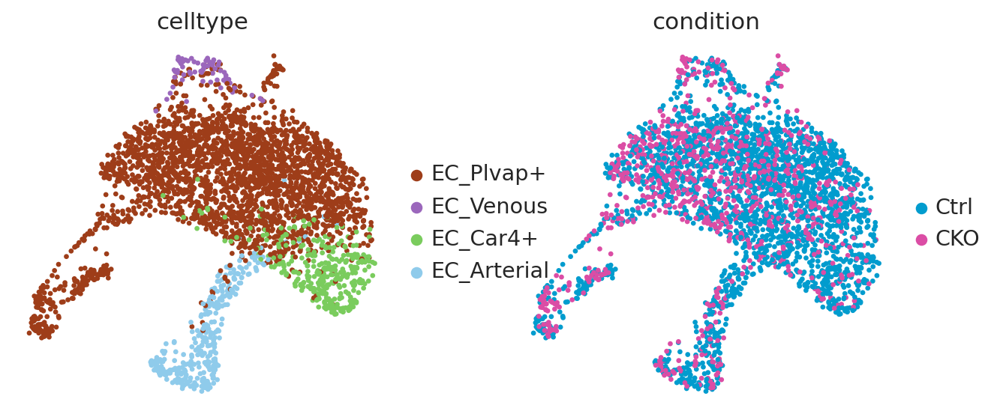

In [6]:
sc.pl.umap(endo, color = ['celltype','condition'], cmap = de.mymap,
           frameon = False,ncols =4)

Condition DEGs of ECs

In [9]:
deg_casz1_endo = de.FindAllMarkers(endo, 'celltype')

Calculate DEGs...


In [10]:
deg_casz1_endo.to_csv('deg/casz1_endo_subtype.csv')

In [11]:
deg_casz1_endo

,names,group,scores,pvals,pvals_adj,logfoldchanges,pct_1,pct_2,diff_pct,group_mean,group_cv
0,Rgcc,EC_Plvap+,17.31,3.90e-67,2.16e-62,2.47,0.89,0.44,0.45,2.22,0.46
1,Gpihbp1,EC_Plvap+,13.90,6.29e-44,4.36e-40,1.99,0.79,0.37,0.42,1.59,0.61
2,Plvap,EC_Plvap+,12.01,3.11e-33,7.84e-30,1.82,0.68,0.32,0.36,1.26,0.76
3,Ccnd1,EC_Plvap+,8.41,4.03e-17,1.88e-14,1.22,0.71,0.40,0.31,1.37,0.73
4,Mest,EC_Plvap+,12.63,1.40e-36,4.57e-33,1.71,0.97,0.68,0.29,2.85,0.27
...,...,...,...,...,...,...,...,...,...,...,...
484,Ogt,EC_Arterial,6.96,3.48e-12,5.50e-10,1.14,0.58,0.37,0.21,0.92,0.93
485,Scd2,EC_Arterial,6.43,1.30e-10,1.70e-08,0.95,0.65,0.44,0.20,1.05,0.81
486,Sox7,EC_Arterial,6.30,2.95e-10,3.71e-08,1.37,0.45,0.25,0.20,0.70,1.19
487,Lpar4,EC_Arterial,7.86,3.74e-15,7.61e-13,1.23,0.65,0.45,0.20,1.29,0.82


Cell type proportion

,Neuroendocrine cells,EC_Venous,Ciliated cells,EC_Arterial,EC_Car4+,Bipotential progenitors,AT1,Club cells,Smooth muscle cells,EC_Plvap+,AT2,Stromal cells
CKO,6.07e-03,7.08e-03,6.83e-03,0.02,0.01,0.05,0.04,0.07,0.10,0.18,0.23,0.27
WT,4.20e-03,3.64e-03,8.95e-03,0.02,0.03,0.03,0.06,0.02,0.17,0.17,0.22,0.26


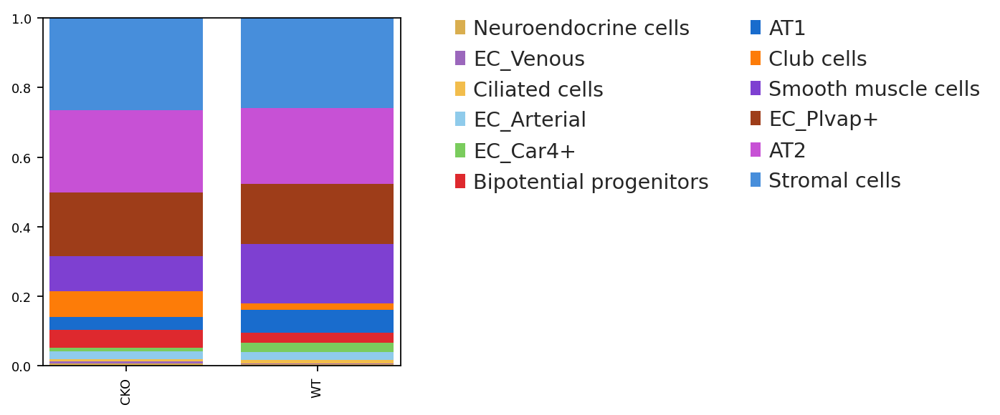

In [60]:
de.stackbarplot(merge_adata, x = 'condition',y='celltype')

In [ ]:
lung = adata[adata.obs['organ']=='Lung']

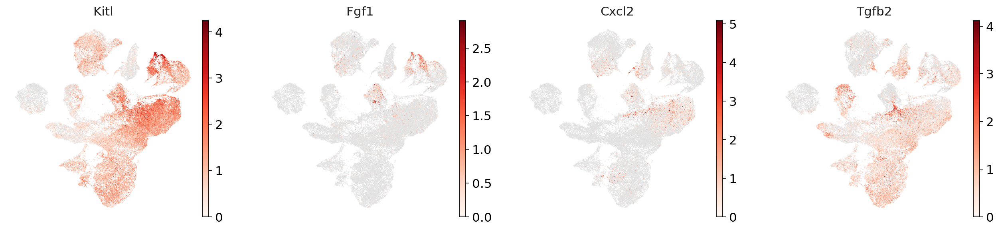

In [141]:
sc.pl.umap(adata, color = ['Kitl','Fgf1','Cxcl2','Tgfb2'], cmap = de.mymap,frameon = False,ncols =4,legend_loc = 'on data')

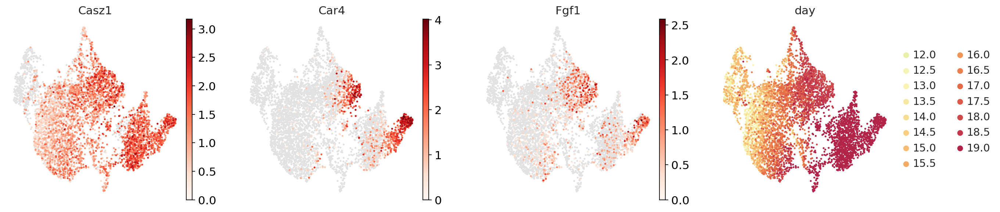

In [157]:
sc.pl.umap(lung, color = ['Casz1','Car4','Fgf1','day'], cmap = de.mymap,frameon = False,ncols =4)

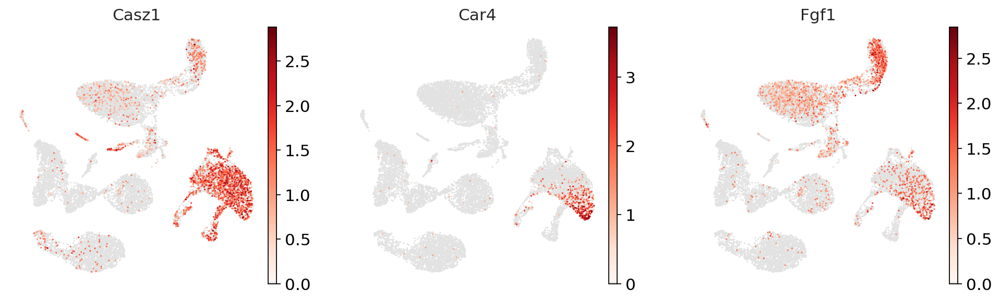

In [61]:
sc.pl.umap(merge_adata, color = ['Casz1','Car4','Fgf1'], cmap = de.mymap,frameon = False,ncols =4)

## 3. The pattern of each batch

In [84]:
batch1 = merge_adata[merge_adata.obs['Batch'] == 'Batch1']
batch2 = merge_adata[merge_adata.obs['Batch'] == 'Batch2']

In [85]:
batch1 = de.oneStepUmap(batch1,n_neighbors=20)

In [86]:
batch2 = de.oneStepUmap(batch2, n_neighbors=20)

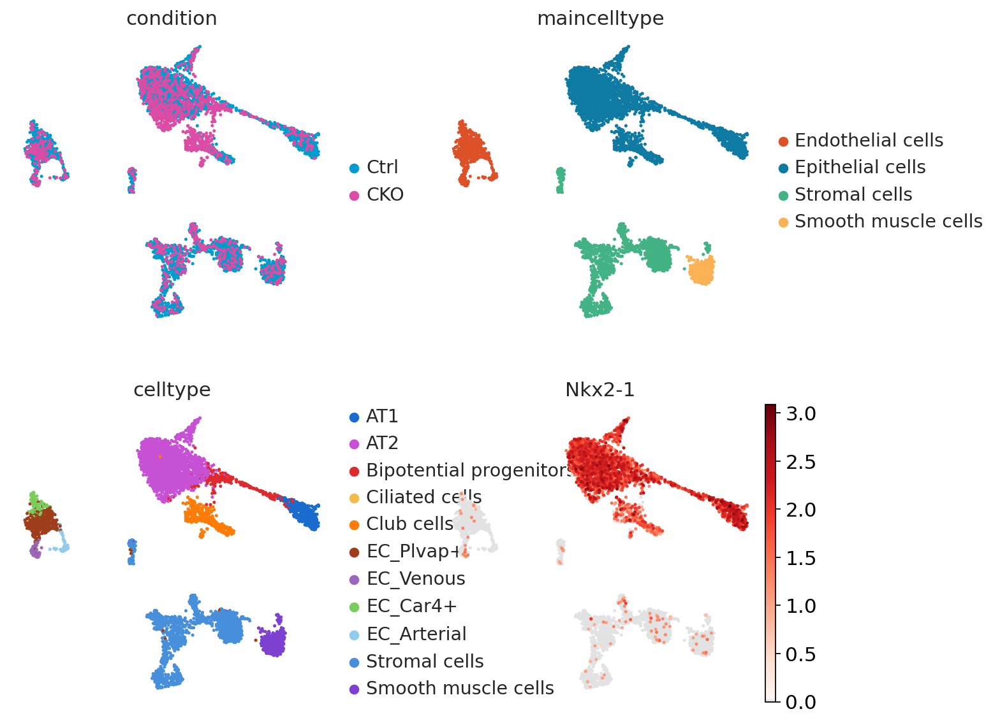

In [88]:
sc.pl.embedding(batch1,basis = 'X_umap', color = ['condition','maincelltype','celltype','Nkx2-1'], cmap = de.mymap,frameon = False,ncols =2 )

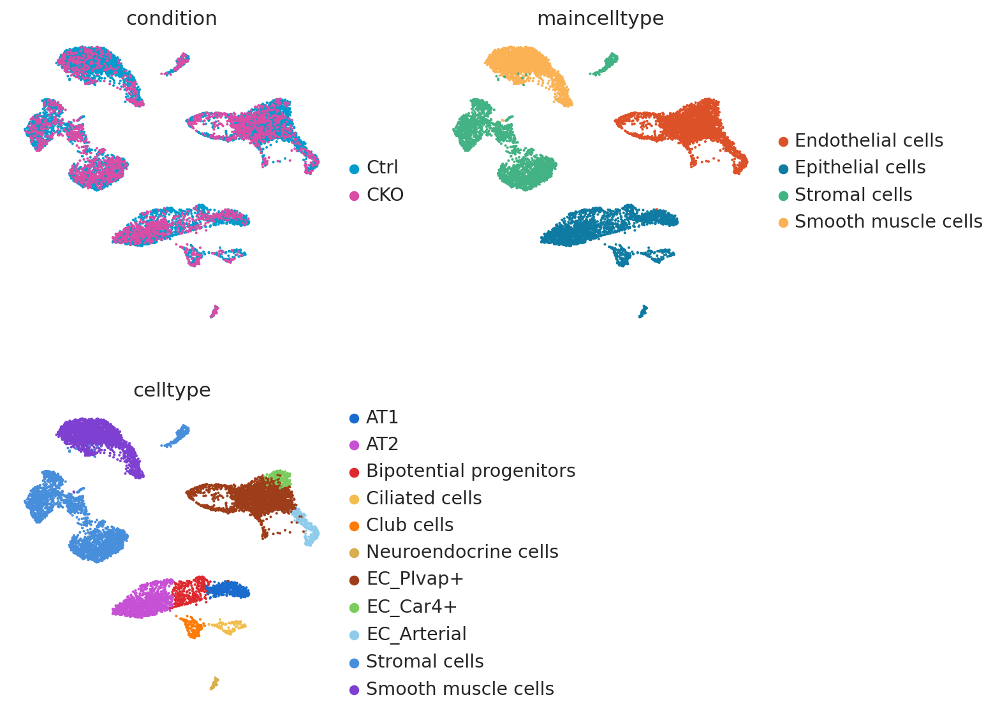

In [89]:
sc.pl.embedding(batch2,basis = 'X_umap', color = ['condition','maincelltype','celltype'], cmap = de.mymap,frameon = False,ncols =2 )

,Bipotential progenitors,AT1,Club cells,AT2
Ctrl,0.06,0.17,0.05,0.73
CKO,0.12,0.05,0.24,0.60


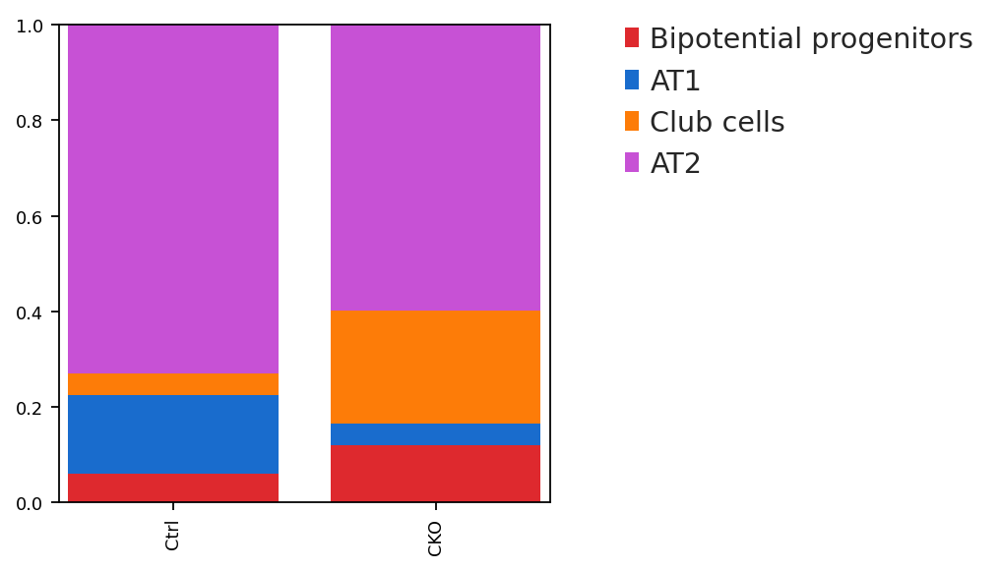

In [90]:
de.stackbarplot(batch1[batch1.obs['maincelltype'] == 'Epithelial cells'], x = 'condition', y = 'celltype',legend_ncol = 1)

,EC_Arterial,EC_Venous,EC_Car4+,EC_Plvap+
Ctrl,0.10,0.08,0.23,0.59
CKO,0.08,0.18,0.12,0.62


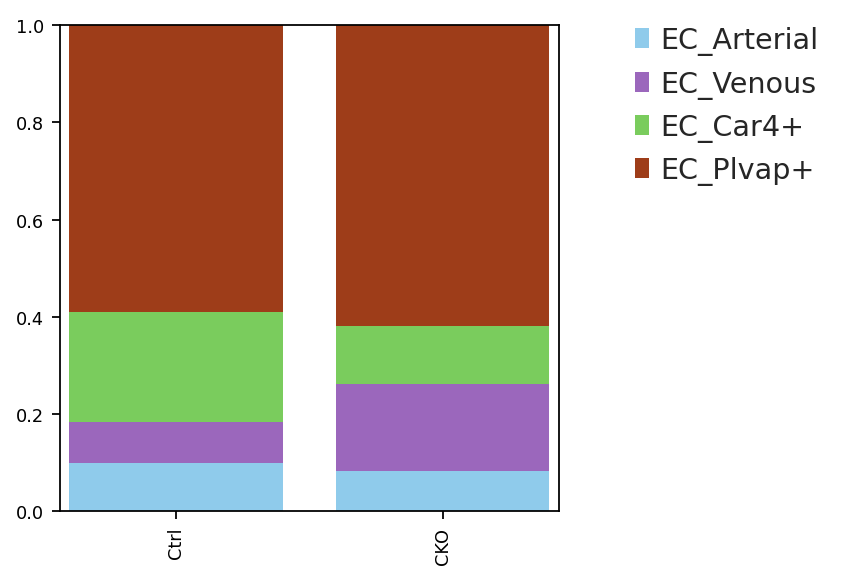

In [91]:
de.stackbarplot(batch1[batch1.obs['maincelltype'] == 'Endothelial cells'], x = 'condition', y = 'celltype',legend_ncol = 1)

,Neuroendocrine cells,Ciliated cells,Club cells,Bipotential progenitors,AT1,AT2
Ctrl,0.03,0.07,0.07,0.13,0.22,0.48
CKO,0.04,0.04,0.10,0.14,0.15,0.53


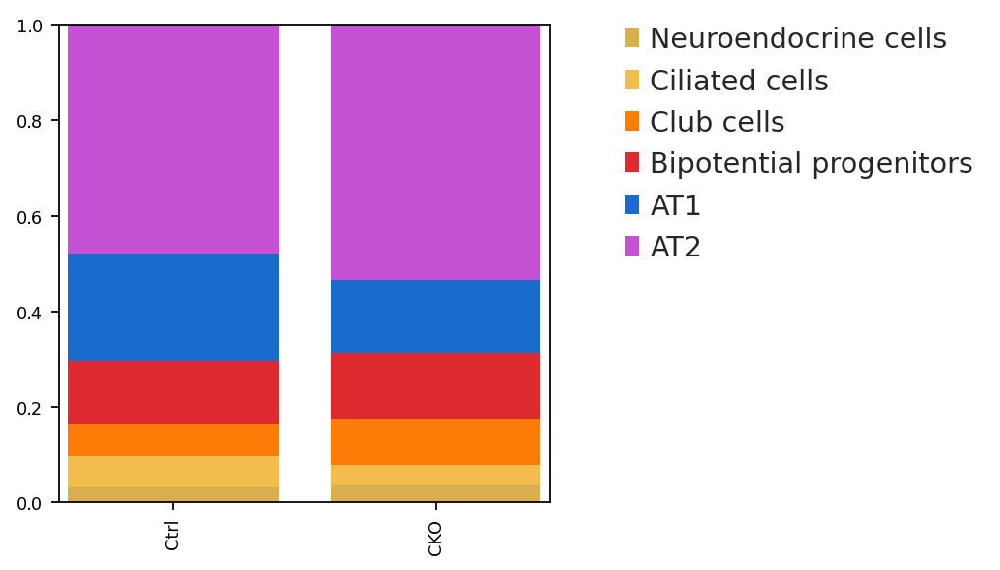

In [92]:
de.stackbarplot(batch2[batch2.obs['maincelltype'] == 'Epithelial cells'], x = 'condition', y = 'celltype',legend_ncol = 1)

,EC_Car4+,EC_Arterial,EC_Plvap+
Ctrl,0.09,0.1,0.81
CKO,0.04,0.1,0.87


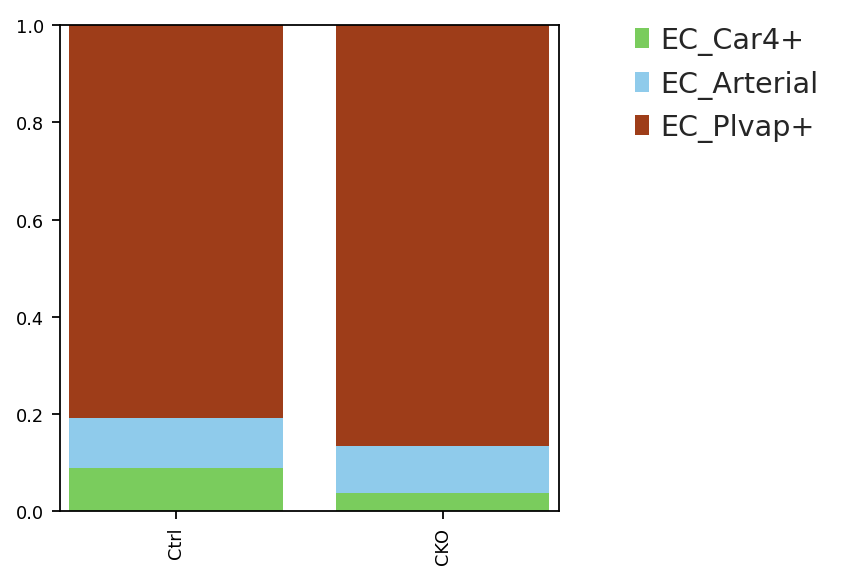

In [93]:
de.stackbarplot(batch2[batch2.obs['maincelltype'] == 'Endothelial cells'], x = 'condition', y = 'celltype',legend_ncol = 1)

,Neuroendocrine cells,Ciliated cells,Bipotential progenitors,Club cells,AT1,AT2
Ctrl,0.01,0.03,0.09,0.05,0.19,0.63
CKO,0.01,0.02,0.13,0.18,0.09,0.57


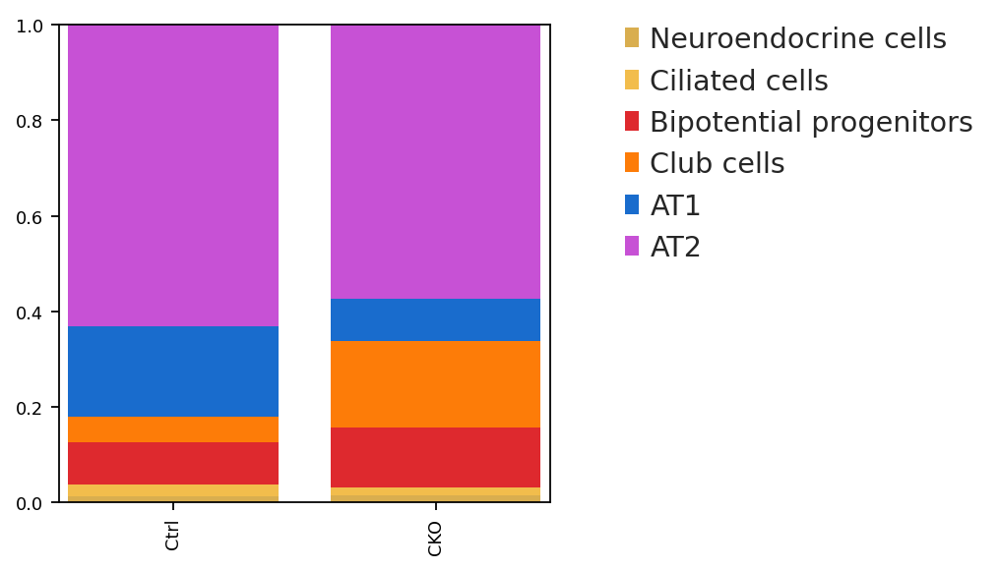

In [94]:
de.stackbarplot(merge_adata[merge_adata.obs['maincelltype'] == 'Epithelial cells'], x = 'condition', y = 'celltype',legend_ncol = 1)

,EC_Venous,EC_Arterial,EC_Car4+,EC_Plvap+
Ctrl,0.02,0.10,0.12,0.76
CKO,0.03,0.09,0.05,0.82


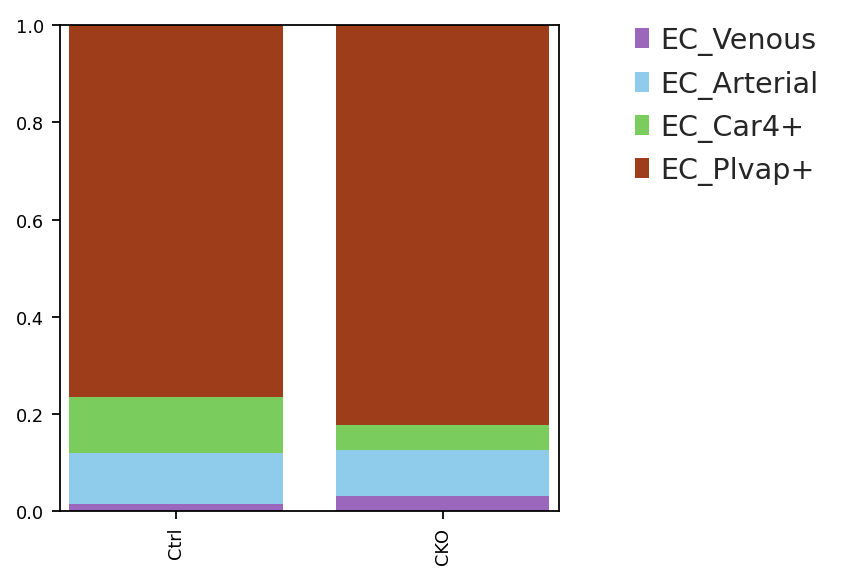

In [95]:
de.stackbarplot(merge_adata[merge_adata.obs['maincelltype'] == 'Endothelial cells'], x = 'condition', y = 'celltype',legend_ncol = 1)

## 4. The expression proportion of Nkx2-1 positive cells

In [96]:
epi1 = batch1[batch1.obs['maincelltype'] == 'Epithelial cells']
epi2 = batch2[batch2.obs['maincelltype'] == 'Epithelial cells']

In [99]:
(epi1[epi1.obs['condition']=='Ctrl','Nkx2-1'].X.A.flatten()>0).sum()/(epi1.obs['condition']=='Ctrl').sum()

0.9618149146451033

In [100]:
(epi1[epi1.obs['condition']=='CKO','Nkx2-1'].X.A.flatten()>0).sum()/(epi1.obs['condition']=='CKO').sum()

0.7697841726618705

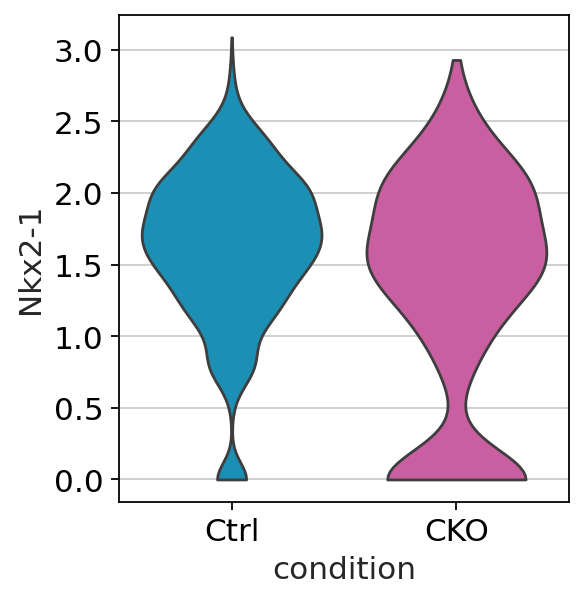

In [101]:
sc.pl.violin(epi1,keys = 'Nkx2-1', groupby = 'condition',jitter = False, size = 0)

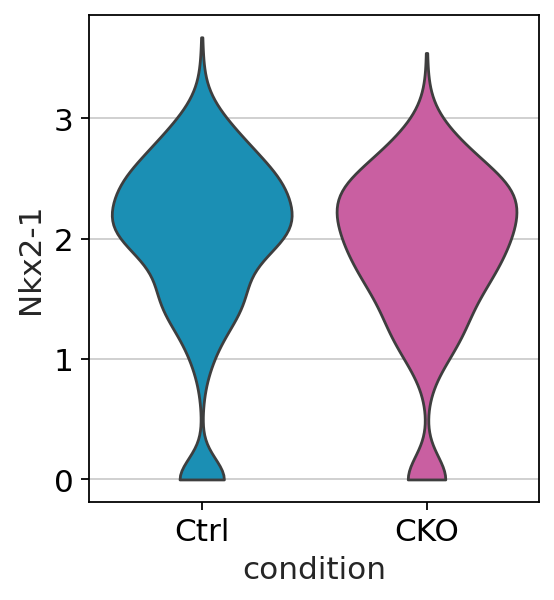

In [102]:
sc.pl.violin(epi2,keys = 'Nkx2-1', groupby = 'condition',jitter = False, size = 0)

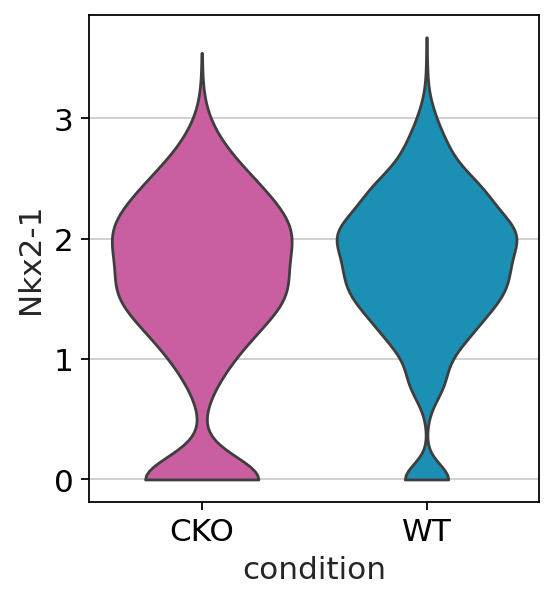

In [107]:
sc.pl.violin(epi,keys = 'Nkx2-1', groupby = 'condition',jitter = False, size = 0)

## 5. Key gene expression in WT and CKO ECs

In [107]:
epi = merge_adata[merge_adata.obs['maincelltype'] == 'Epithelial cells']
endo = merge_adata[merge_adata.obs['maincelltype'] == 'Endothelial cells']

In [108]:
wt_endo = endo[endo.obs['condition'] == 'Ctrl']
ko_endo = endo[endo.obs['condition'] == 'CKO']
wt_endo = de.oneStepUmap(wt_endo)
ko_endo = de.oneStepUmap(ko_endo)

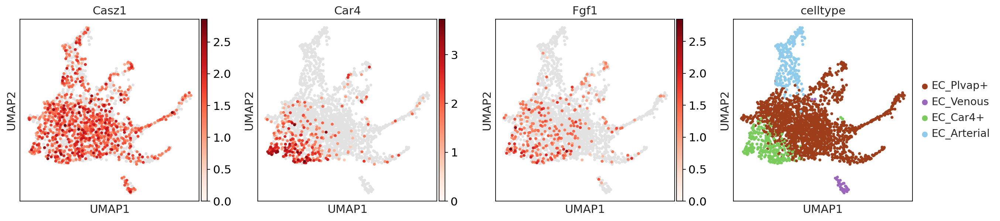

In [109]:
sc.pl.umap(wt_endo, color = ['Casz1','Car4','Fgf1','celltype'], cmap = de.mymap)

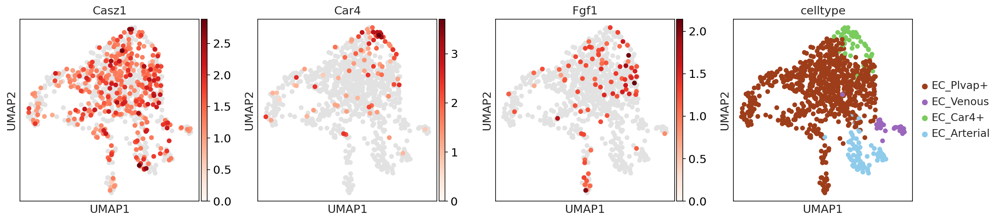

In [110]:
sc.pl.umap(ko_endo, color = ['Casz1','Car4','Fgf1','celltype'], cmap = de.mymap)

## 6. Predict the developmental stage of CKO ECs

Mapping the E18.5 WT and CKO cell on STED-EC atlas, and predict the stage probability of cells.

In [44]:
merge_adata_endo = merge_adata[merge_adata.obs['maincelltype'] == 'Endothelial cells']
lung_adata = adata[adata.obs['organ'] == 'Lung']

In [87]:
merge_jiazi = de.fateMapping(lung_adata, merge_adata_endo, predict_labels = 'embryonic_period',runpca=True,runcca=True,runharmony=True,pca_rescale = True)

Runing PCA...
Runing CCA...


2024-08-06 15:36:07,344 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-06 15:36:25,262 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-06 15:36:25,802 - harmonypy - INFO - Iteration 1 of 10
2024-08-06 15:36:35,205 - harmonypy - INFO - Iteration 2 of 10
2024-08-06 15:36:44,901 - harmonypy - INFO - Iteration 3 of 10
2024-08-06 15:36:54,330 - harmonypy - INFO - Iteration 4 of 10
2024-08-06 15:37:04,701 - harmonypy - INFO - Iteration 5 of 10
2024-08-06 15:37:11,199 - harmonypy - INFO - Iteration 6 of 10
2024-08-06 15:37:17,405 - harmonypy - INFO - Iteration 7 of 10
2024-08-06 15:37:23,206 - harmonypy - INFO - Iteration 8 of 10
2024-08-06 15:37:28,601 - harmonypy - INFO - Iteration 9 of 10
2024-08-06 15:37:33,804 - harmonypy - INFO - Iteration 10 of 10
2024-08-06 15:37:38,714 - harmonypy - INFO - Stopped before convergence


In [88]:
de.label_cells(merge_jiazi, annotation = {'born':'E19.0'}, key = 'embryonic_period',label = 'embryonic_period')

In [89]:
import re
merge_adata.obs['mouse_stage'] = [float(re.sub('E','',i)) for i in merge_adata.obs['embryonic_period']]
merge_adata.obs['mouse_stage']= pd.Categorical(merge_adata.obs['mouse_stage'])

In [90]:
adata.obs['stage'] = adata.obs['embryonic_period']
adata.obs['stage'] = [float(re.sub('E','',i)) for i in adata.obs['stage']]
adata.obs['stage']  = pd.Categorical(adata.obs['stage'], np.unique(adata.obs['stage']))
adata.uns['stage_colors']  = adata.uns['embryonic_period_colors']

In [99]:
dm = 'X_cca_harmony'
jiazi = merge_jiazi[merge_jiazi.obs['fatemap'] == 'base']
cko = merge_jiazi[(merge_jiazi.obs['fatemap'] == 'predict')&(merge_jiazi.obs['condition'] == 'CKO')]
wt = merge_jiazi[(merge_jiazi.obs['fatemap'] == 'predict')&(merge_jiazi.obs['condition'] == 'Ctrl')]
m_jiazi = []
for t in jiazi.obs['embryonic_period'].unique():
    m_jiazi.append(jiazi.obsm[dm][jiazi.obs['embryonic_period'] == t].mean(0))
m_jiazi = pd.DataFrame(np.vstack(m_jiazi), index = jiazi.obs['embryonic_period'].unique())
m_exp = pd.DataFrame(np.vstack([np.array(wt.obsm[dm]).mean(0), np.array(cko.obsm['X_cca_harmony']).mean(0)]), index = ['Ctrl','CKO'])

In [144]:
d = 1-de.fast_corrcoef(m_jiazi, m_exp)
sim  = np.exp(-d**2)

In [145]:
sim = pd.DataFrame(sim, index = m_jiazi.index.values, columns = m_exp.index.values)

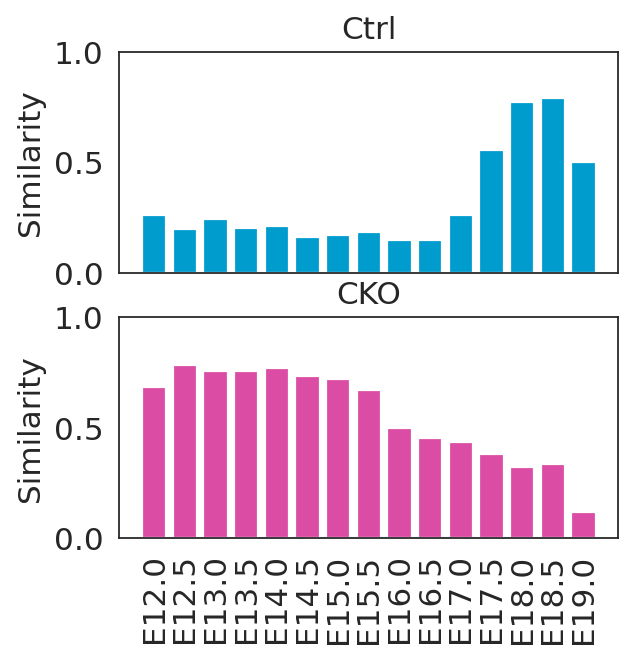

In [147]:
fig,ax = plt.subplots(2,1, figsize = (4,4), sharex = True,sharey = True)
ax[0].bar(sim.index.values, sim['Ctrl'],color ='#019CCE')
ax[1].bar(sim.index.values, sim['CKO'],color = '#DB4DA5')
xticklabels = ax[1].get_xticklabels()
ax[1].set_xticklabels(xticklabels, rotation=90)
ax[0].set_yticks([0,0.5,1])
ax[1].set_yticks([0,0.5,1])
ax[0].set_ylabel('Similarity')
ax[1].set_ylabel('Similarity')
ax[0].set_title('Ctrl')
ax[1].set_title('CKO')
plt.savefig('figures/Fig6m.pdf')

In [111]:
sim

,Ctrl,CKO
E12.0,0.26,0.68
E12.5,0.20,0.78
E13.0,0.24,0.76
E13.5,0.20,0.76
E14.0,0.21,0.77
E14.5,0.16,0.73
E15.0,0.17,0.72
E15.5,0.18,0.67
E16.0,0.15,0.50
E16.5,0.15,0.46


In [92]:
from scipy import stats
n = 1000
data1 = np.array(merge_adata[merge_adata.obs['condition'] == 'Ctrl'].obs['mouse_stage'])
data2 = np.array(merge_adata[merge_adata.obs['condition'] == 'CKO'].obs['mouse_stage'])
np.random.seed(1)
data1 = np.random.choice(data1, n, replace = False)
data2 = np.random.choice(data2, n, replace = False)
t_stat, p_value = stats.ttest_ind(data1, data2,equal_var=True)

print(f"t-statistic: {t_stat}")
print(f"p-value: {p_value}")

t-statistic: 4.896819440264041
p-value: 1.052222697487238e-06


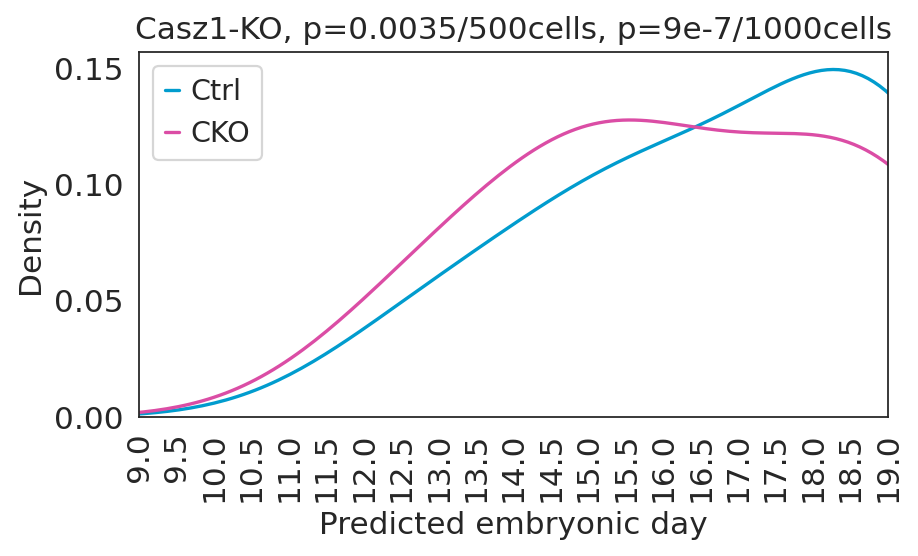

In [93]:
bw = 0.65
color_anno = {'Ctrl':'#019CCE','CKO':'#DB4DA5'}
celltypes = ['Ctrl','CKO']
fig, axs = plt.subplots(1, 1, figsize=(6,3), gridspec_kw={'wspace':0.9})
for celltype in celltypes:
    # ax = axs[celltypes.index(celltype)]
    ax = axs
    ax.set_title('Casz1-KO, p=0.0035/500cells, p=9e-7/1000cells')
    df_val = merge_adata[merge_adata.obs['condition'] == celltype].obs
    df = df_val
    g = sns.distplot(df['mouse_stage'],hist = False, color=color_anno[celltype],kde_kws={'bw':bw},ax = ax,label =celltype)
    g.set(xticks=np.arange(9.0,23.0,0.5))
    g.set_xticklabels(np.arange(9.0,23.0,0.5), rotation=90)
    g.set_xlabel('Predicted embryonic day')
    g.set(xlim=(9.0, 19.0))
    sns.set_style("white")
plt.legend()
# plt.savefig('figures/Fig7B_Distplot_predict_stage_for_Casz1-KO_PCA_CCA_Harmony.pdf')

In [300]:
sc.pp.neighbors(merge_jiazi, n_neighbors=10, n_pcs=20, use_rep = 'X_cca_harmony')
sc.tl.umap(merge_jiazi)

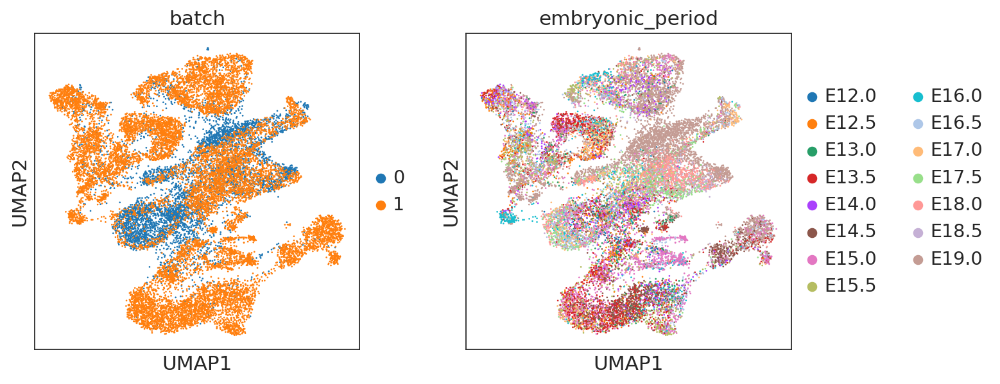

In [303]:
sc.pl.umap(merge_jiazi, color = ['batch','embryonic_period'])

## Fgf1的表达

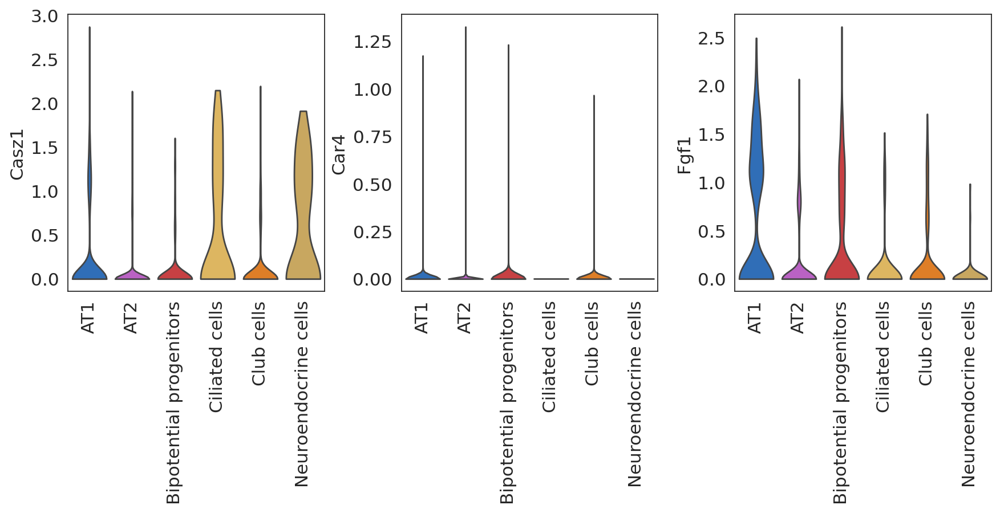

In [178]:
sc.pl.violin(
    epi,
    ["Casz1","Car4", "Fgf1"],
    groupby="celltype",
    stripplot=False,  jitter = False, size = 0, rotation=90# adds a boxplot inside violins
)

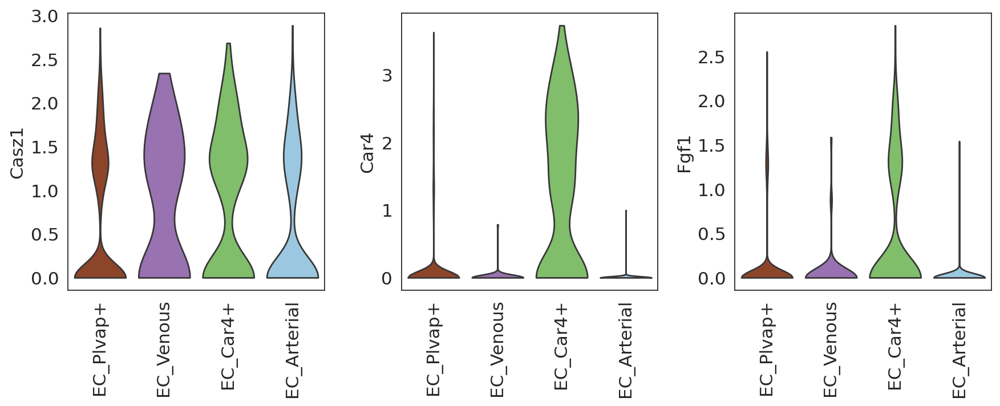

In [179]:
sc.pl.violin(
    endo,
    ["Casz1","Car4", "Fgf1"],
    groupby="celltype",
    stripplot=False,  jitter = False, size = 0, rotation=90# adds a boxplot inside violins
)

In [180]:
adata = adata[adata.obs['label_2024']!='Others']

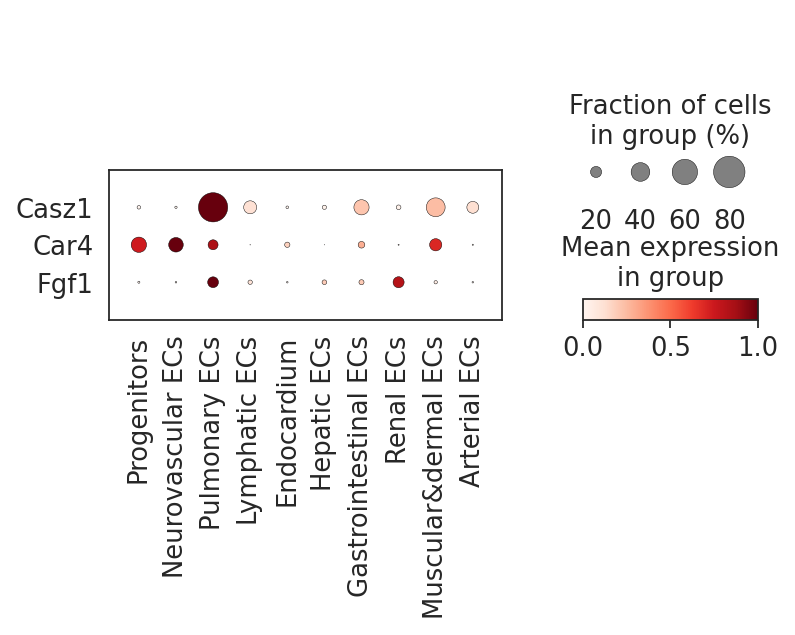

In [181]:
sc.pl.dotplot(adata, {'':["Casz1","Car4", "Fgf1"]}, "label_2024", dendrogram=False, standard_scale = 'var',swap_axes = True)

## 7. Cell-cell communications

In [185]:
sub_adata = merge_adata[merge_adata.obs['maincelltype'].isin(['Epithelial cells','Endothelial cells'])]

In [186]:
wt= sub_adata[sub_adata.obs['condition'] == 'Ctrl']
ko= sub_adata[sub_adata.obs['condition'] == 'CKO']
wt.obs = wt.obs.loc[:,['condition','maincelltype','celltype','embryonic_period']]
ko.obs = ko.obs.loc[:,['condition','maincelltype','celltype','embryonic_period']]
sub_adata.obs = sub_adata.obs.loc[:,['condition','maincelltype','celltype','embryonic_period']]

In [187]:
%%R
library(Seurat)
library(CellChat)
library(circlize)
CellChatDB <- CellChatDB.mouse
ccdb <- subsetDB(CellChatDB, search = c("Secreted Signaling","ECM-Receptor",'Cell-Cell Contact'), key = "annotation")
names(ccdb)
write.csv(ccdb[['interaction']], 'data/CellChatDB_interaction.csv')
write.csv(ccdb[['complex']], 'data/CellChatDB_complex.csv')
write.csv(ccdb[['geneInfo']], 'data/CellChatDB_geneInfo.csv')


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘sp’

The following object is masked from ‘package:IRanges’:

    %over%

‘SeuratObject’ was built with package ‘Matrix’ 1.6.3 but the current
version is 1.6.5; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed

Attaching package: ‘SeuratObject’

The following object is masked from ‘package:IRanges’:

    intersect

The following object is masked from ‘package:S4Vectors’:

    intersect

The following object is masked from ‘package:BiocGenerics’:

    intersect

The following object is masked from ‘package:base’:

    intersect

Loading required package: dplyr

Attaching package: ‘dplyr’

The following object is masked from ‘package:AnnotationDbi’:

    select

The following objects are masked from ‘package:IRanges’:

    collapse, desc, intersect, setdiff, slice, union

The following objects are masked from ‘package:S4Vectors’:

    first, intersect, rename

In [201]:
sub_adata.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,barcode,stage,condition,doublet,batch,leiden,fatemap,labels,maincelltype,subtype,celltype,Batch,embryonic_period,mouse_stage
AAACCCAAGTCGCCAC-WT-Batch2,1462,3548.0,108.0,3.04,AAACCCAAGTCGCCAC,E18.5,Ctrl,2.31e-02,0,0,predict,Progenitors,Epithelial cells,Undefined,AT2,Batch2,E13.0,13.0
AAACGAAAGAGGACTC-WT-Batch2,1034,3097.0,18.0,0.58,AAACGAAAGAGGACTC,E18.5,Ctrl,5.93e-03,0,0,predict,Progenitors,Epithelial cells,Undefined,AT2,Batch2,E12.5,12.5
AAACGAAAGCGTTAGG-WT-Batch2,1966,4021.0,1.0,0.02,AAACGAAAGCGTTAGG,E18.5,Ctrl,8.29e-02,0,7,predict,Proximal cells,Epithelial cells,Undefined,Ciliated cells,Batch2,E15.5,15.5
AAACGAACACATATCG-WT-Batch2,1342,3336.0,2.0,0.06,AAACGAACACATATCG,E18.5,Ctrl,2.64e-02,0,5,predict,AT1,Epithelial cells,Undefined,Bipotential progenitors,Batch2,E12.0,12.0
AAACGAACAGAGCGTA-WT-Batch2,1454,3177.0,48.0,1.51,AAACGAACAGAGCGTA,E18.5,Ctrl,4.83e-02,0,1,predict,Endothelial cells,Endothelial cells,EC_Plvap+,EC_Plvap+,Batch2,E17.5,17.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTAGCTCCCTT-CKO-Batch1,2347,6635.0,328.0,4.94,TTTGACTAGCTCCCTT,E18.5,CKO,NaN,1,0,predict,AT2,Epithelial cells,Undefined,AT2,Batch1,E19.0,19.0
TTTGATCAGGCATCAG-CKO-Batch1,1853,5497.0,208.0,3.78,TTTGATCAGGCATCAG,E18.5,CKO,NaN,1,0,predict,Progenitors,Epithelial cells,Undefined,AT2,Batch1,E17.0,17.0
TTTGATCGTAGAAACT-CKO-Batch1,896,2750.0,70.0,2.55,TTTGATCGTAGAAACT,E18.5,CKO,NaN,1,7,predict,Proximal cells,Epithelial cells,Undefined,Club cells,Batch1,E15.0,15.0
TTTGATCGTTCAAAGA-CKO-Batch1,947,2559.0,50.0,1.95,TTTGATCGTTCAAAGA,E18.5,CKO,NaN,1,7,predict,Proximal cells,Epithelial cells,Undefined,Club cells,Batch1,E15.0,15.0


In [203]:
%%R -i sub_adata,wt,ko
library(Seurat)
library(CellChat)
library(circlize)

In [204]:
%%R
CellChatDB <- CellChatDB.mouse
CellChatDB.use <- subsetDB(CellChatDB, search = c("Secreted Signaling","ECM-Receptor",'Cell-Cell Contact'), key = "annotation")
PPI = PPI.mouse
sub_adata <- createCellChat(object = assay(sub_adata), meta = as.data.frame(colData(sub_adata)), group.by ='condition')
sub_adata@DB <- CellChatDB.use
sub_adata <- subsetData(sub_adata) 
sub_adata <- identifyOverExpressedGenes(sub_adata)

wt <- createCellChat(object = assay(wt), meta = as.data.frame(colData(wt)), group.by ='celltype')
wt@DB <- CellChatDB.use
wt <- subsetData(wt) 
wt@var.features$features = sub_adata@var.features$features
#wt <- identifyOverExpressedGenes(wt)
wt <- identifyOverExpressedInteractions(wt, features = wt@var.features$features)
wt <- projectData(wt, PPI)

ko <- createCellChat(object = assay(ko), meta = as.data.frame(colData(ko)), group.by ='celltype')
ko@DB <- CellChatDB.use
ko <- subsetData(ko) 
ko@var.features$features = sub_adata@var.features$features
#ko <- identifyOverExpressedGenes(ko)
ko <- identifyOverExpressedInteractions(ko, features = ko@var.features$features)
ko <- projectData(ko, PPI)

[1] "Create a CellChat object from a data matrix"
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  Ctrl CKO 
Issue identified!! Please check the official Gene Symbol of the following genes:  
 H2-BI H2-Ea-ps 
  |                                                  | 0 % ~calculating   |+                                                 | 1 % ~16s           |++                                                | 2 % ~11s           |++                                                | 3 % ~09s           |+++                                               | 4 % ~08s           |+++                                               | 6 % ~08s           |++++                                              | 7 % ~07s           |++++                                              | 8 % ~07s           |+++++                                             | 9 % ~07s           |+++++                                             | 10% ~06s           |++++++              

In [205]:
%%R
wt <- computeCommunProb(wt,type = "truncatedMean")
ko <- computeCommunProb(ko,type = "truncatedMean")

truncatedMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-07-05 03:37:56.228365]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-07-05 03:43:09.748062]"
truncatedMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-07-05 03:43:11.548399]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-07-05 03:47:05.992551]"


  |======================================================================| 100%
  |======================================================================| 100%


In [206]:
%%R 
wt <- filterCommunication(wt, min.cells = 10)
wt <- computeCommunProbPathway(wt)
wt <- aggregateNet(wt)
df.net <- subsetCommunication(wt)
write.csv(df.net, paste0('cellchat/','wt_lr','_cellchat_celltype.csv'))

ko <- filterCommunication(ko, min.cells = 10)
ko <- computeCommunProbPathway(ko)
ko <- aggregateNet(ko)
df.net <- subsetCommunication(ko)
write.csv(df.net, paste0('cellchat/','ko_lr','_cellchat_celltype.csv'))

In [207]:
wt_lr = pd.read_csv('cellchat/wt_lr_cellchat_celltype.csv',index_col = 0)
ko_lr = pd.read_csv('cellchat/ko_lr_cellchat_celltype.csv',index_col = 0)

## 8. Plotting the cell-cell interactions

Using CellChat

In [13]:
wt_lr = pd.read_csv('cellchat/wt_lr_cellchat_celltype.csv',index_col = 0)
ko_lr = pd.read_csv('cellchat/ko_lr_cellchat_celltype.csv',index_col = 0)

In [14]:
ko_lr['condition'] = 'CKO'
wt_lr['condition'] = 'Ctrl'
lr = pd.concat([ko_lr, wt_lr])

In [15]:
merge_adata.obs['celltype'].cat.categories

Index(['AT1', 'AT2', 'Bipotential progenitors', 'Ciliated cells', 'Club cells',
       'Neuroendocrine cells', 'EC_Plvap+', 'EC_Venous', 'EC_Car4+',
       'EC_Arterial', 'Stromal cells', 'Smooth muscle cells'],
      dtype='object')

In [16]:
anno  =pd.Series(['Epithelial cells']*6+['Endothelial cells']*4, index = ['AT1', 'AT2','Bipotential progenitors', 'Ciliated cells','Club cells','Neuroendocrine cells',
                                                                          'EC_Arterial', 'EC_Car4+', 'EC_Plvap+','EC_Venous'])
lr['source1'] = [anno[i] for i in lr['source']]
lr['target1'] = [anno[i] for i in lr['target']]
lr['id'] = [lr['source'].values[i]+'_'+lr['target'].values[i]+'_'+lr['interaction_name_2'].values[i] for i in range(lr.shape[0])]
lr['id_source'] = [lr['source'].values[i]+'_'+lr['target'].values[i]+'_'+lr['interaction_name_2'].values[i]+lr['condition'].values[i] for i in range(lr.shape[0])]
lr['id1'] = [lr['source1'].values[i]+'_'+lr['target1'].values[i]+'_'+lr['interaction_name_2'].values[i]+'_'+lr['condition'].values[i] for i in range(lr.shape[0])]
lr_unique = lr.drop_duplicates(subset=['id1'])

In [17]:
sub_lr = lr[lr['source']!=lr['target']]
sub_lr = sub_lr[sub_lr['source1']!=sub_lr['target1']]
sub_lr = sub_lr.sort_values(by='prob', ascending= False).drop_duplicates(subset=['id'])
sub_lr = sub_lr.drop_duplicates(subset=['id_source'])
sub_lr = sub_lr[sub_lr['annotation'].isin(['Secreted Signaling', 'Cell-Cell Contact'])] # 由于连接数目太多，不考虑细胞基质的信号
sub_lr2 = sub_lr.copy()

In [18]:
sub_lr[(sub_lr['ligand'] == 'Fgf1')&(sub_lr['source'] == 'EC_Car4+')&(sub_lr['target1'] == 'Epithelial cells')].sort_values('prob',ascending=False)

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence,condition,source1,target1,id,id_source,id1
371,EC_Car4+,Club cells,Fgf1,Fgfr3,1.83e-03,0.0,FGF1_FGFR3,Fgf1 - Fgfr3,FGF,Secreted Signaling,PMC: 4393358,Ctrl,Endothelial cells,Epithelial cells,EC_Car4+_Club cells_Fgf1 - Fgfr3,EC_Car4+_Club cells_Fgf1 - Fgfr3Ctrl,Endothelial cells_Epithelial cells_Fgf1 - Fgf...
358,EC_Car4+,AT1,Fgf1,Fgfr3,1.47e-03,0.0,FGF1_FGFR3,Fgf1 - Fgfr3,FGF,Secreted Signaling,PMC: 4393358,Ctrl,Endothelial cells,Epithelial cells,EC_Car4+_AT1_Fgf1 - Fgfr3,EC_Car4+_AT1_Fgf1 - Fgfr3Ctrl,Endothelial cells_Epithelial cells_Fgf1 - Fgf...
366,EC_Car4+,Bipotential progenitors,Fgf1,Fgfr3,8.18e-04,0.0,FGF1_FGFR3,Fgf1 - Fgfr3,FGF,Secreted Signaling,PMC: 4393358,Ctrl,Endothelial cells,Epithelial cells,EC_Car4+_Bipotential progenitors_Fgf1 - Fgfr3,EC_Car4+_Bipotential progenitors_Fgf1 - Fgfr3...,Endothelial cells_Epithelial cells_Fgf1 - Fgf...
361,EC_Car4+,AT2,Fgf1,Fgfr3,1.87e-04,0.0,FGF1_FGFR3,Fgf1 - Fgfr3,FGF,Secreted Signaling,PMC: 4393358,Ctrl,Endothelial cells,Epithelial cells,EC_Car4+_AT2_Fgf1 - Fgfr3,EC_Car4+_AT2_Fgf1 - Fgfr3Ctrl,Endothelial cells_Epithelial cells_Fgf1 - Fgf...


In [19]:
rename = {'AT1':'A1_AT1',
          'AT2':'A2_AT2',
          'Bipotential progenitors':'A3_Bipotential progenitors',
          'Ciliated cells':'A4_Ciliated cells',
          'Club cells':'A5_Club cells',
          'Neuroendocrine cells':'A6_Neuroendocrine cells',
          'EC_Arterial':'B1_EC_Arterial',
          'EC_Car4+':'B2_EC_Car4', 
          'EC_Plvap+':'B3_EC_Plvap',
          'EC_Venous':'B4_EC_Venous'}
for i in rename:
    sub_lr['source'] = sub_lr['source'].str.replace(i, rename[i])
    sub_lr['target'] = sub_lr['target'].str.replace(i, rename[i])
color_anno = dict(zip(merge_adata.obs['celltype'].cat.categories, merge_adata.uns['celltype_colors']))
celltype_colors = [color_anno[i] for i in rename.keys()]
celltype = [rename[i] for i in rename.keys()]

In [20]:
celltype[7] = 'B2_EC_Car4+'
celltype[8] = 'B3_EC_Plvap+'

In [22]:
sub_lr.to_csv('Casz1_Fgf1_LR.csv')

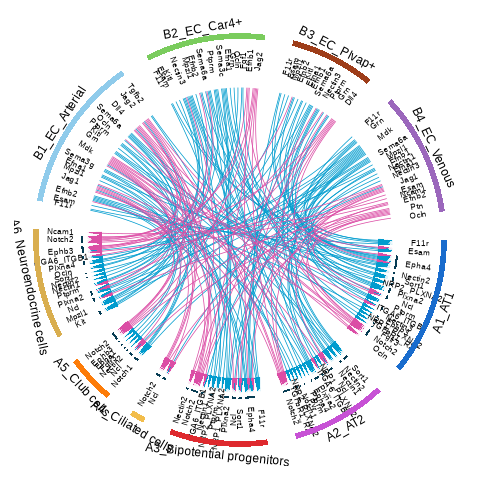

In [233]:
%%R -i sub_lr,celltype,celltype_colors
library(iTALK)
# pdf(paste0('figures/Fig7F_','Casz1','_italk_new.pdf'))
df = sub_lr
df = df[df$source1 == 'Endothelial cells',]
df = df[df$prob > 0.0014, ]
df = df[,c('source','target','ligand','receptor','annotation','condition')]
colnames(df) = c('cell_from','cell_to','ligand','receptor','comm_type','label')
df = rbind(df[df$label=='Ctrl',], df[df$label=='CKO',])
arr_col_anno = structure(c('#DB4DA5', '#019CCE'),
                  names = c('CKO','Ctrl'))

link.arr.col = arr_col_anno[df$label]
# colr = c('#CF87B9', '#10A597', '#EF473A', '#558AC8', '#83CBF1', '#EF7D21','#F6B1D0', '#A7ADDA', '#DAA882', '#FFE07B')
names(celltype_colors) = celltype
LRPlot(df,datatype='mean count',cell_col=celltype_colors,link.arr.lwd=df$prob,link.arr.width=df$prob,
      link.arr.col = link.arr.col)
# dev.off()

## 9. Outgoing and incomming signals

In [268]:
sub_wt = sub_lr2[sub_lr2['condition'] == 'Ctrl']
sub_ko = sub_lr2[sub_lr2['condition'] == 'CKO']

wt_obs = merge_adata.obs[merge_adata.obs['condition'] == 'Ctrl']
ko_obs = merge_adata.obs[merge_adata.obs['condition'] == 'CKO']

p_wt = wt_obs.groupby('maincelltype')['celltype'].value_counts(normalize=True).reset_index(name='Proportion')
p_ko = ko_obs.groupby('maincelltype')['celltype'].value_counts(normalize=True).reset_index(name='Proportion')

p_wt.index = p_wt['celltype'].values
p_ko.index = p_ko['celltype'].values
p_wt = p_wt[p_wt['Proportion'] > 0]
p_ko = p_ko[p_ko['Proportion'] > 0]

p_wt = p_wt[p_wt['maincelltype'].isin(['Endothelial cells','Epithelial cells'])]
p_ko = p_ko[p_ko['maincelltype'].isin(['Endothelial cells','Epithelial cells'])]

In [269]:
p_wt

,maincelltype,celltype,Proportion
EC_Plvap+,Endothelial cells,EC_Plvap+,0.76
EC_Car4+,Endothelial cells,EC_Car4+,0.12
EC_Arterial,Endothelial cells,EC_Arterial,0.10
EC_Venous,Endothelial cells,EC_Venous,0.02
AT2,Epithelial cells,AT2,0.63
AT1,Epithelial cells,AT1,0.19
Bipotential progenitors,Epithelial cells,Bipotential progenitors,0.09
Club cells,Epithelial cells,Club cells,0.05
Ciliated cells,Epithelial cells,Ciliated cells,0.03
Neuroendocrine cells,Epithelial cells,Neuroendocrine cells,0.01


In [271]:
# outgoing_wt = sub_wt.groupby(['source'])['prob'].sum()
# incomming_wt = sub_wt.groupby(['target'])['prob'].sum()

# outgoing_ko = sub_ko.groupby(['source'])['prob'].sum()
# incomming_ko = sub_ko.groupby(['target'])['prob'].sum()

outgoing_wt = sub_wt.groupby(['source'])['prob'].count()
incomming_wt = sub_wt.groupby(['target'])['prob'].count()

outgoing_ko = sub_ko.groupby(['source'])['prob'].count()
incomming_ko = sub_ko.groupby(['target'])['prob'].count()
celltype = outgoing_wt.index.values

wt = pd.DataFrame({'outgoing':outgoing_wt[celltype].values,
                   'incomming':incomming_wt[celltype].values,
                   'cell_proportion':p_wt.loc[celltype,'Proportion'].values,
                    'celltype':celltype})

ko = pd.DataFrame({'outgoing':outgoing_ko[celltype].values,
                   'incomming':incomming_ko[celltype].values,
                   'cell_proportion':p_ko.loc[celltype,'Proportion'].values,
                    'celltype':celltype})

In [273]:
wt

,outgoing,incomming,cell_proportion,celltype
0,54,51,0.19,AT1
1,30,56,0.63,AT2
2,58,42,0.09,Bipotential progenitors
3,24,5,0.03,Ciliated cells
4,34,36,0.05,Club cells
5,59,71,0.10,EC_Arterial
6,66,64,0.12,EC_Car4+
7,55,32,0.76,EC_Plvap+
8,49,61,0.02,EC_Venous
9,28,39,0.01,Neuroendocrine cells


In [275]:
colors = dict(zip(merge_adata.obs['celltype'].cat.categories.tolist(), merge_adata.uns['celltype_colors']))

In [276]:
wt['diff'] = abs(wt['cell_proportion']-ko['cell_proportion'])
ko['diff'] = abs(wt['cell_proportion']-ko['cell_proportion'])

In [277]:
wt

,outgoing,incomming,cell_proportion,celltype,diff
0,54,51,0.19,AT1,1.00e-01
1,30,56,0.63,AT2,5.80e-02
2,58,42,0.09,Bipotential progenitors,3.84e-02
3,24,5,0.03,Ciliated cells,9.19e-03
4,34,36,0.05,Club cells,1.27e-01
5,59,71,0.10,EC_Arterial,8.81e-03
6,66,64,0.12,EC_Car4+,6.36e-02
7,55,32,0.76,EC_Plvap+,5.71e-02
8,49,61,0.02,EC_Venous,1.53e-02
9,28,39,0.01,Neuroendocrine cells,2.57e-03


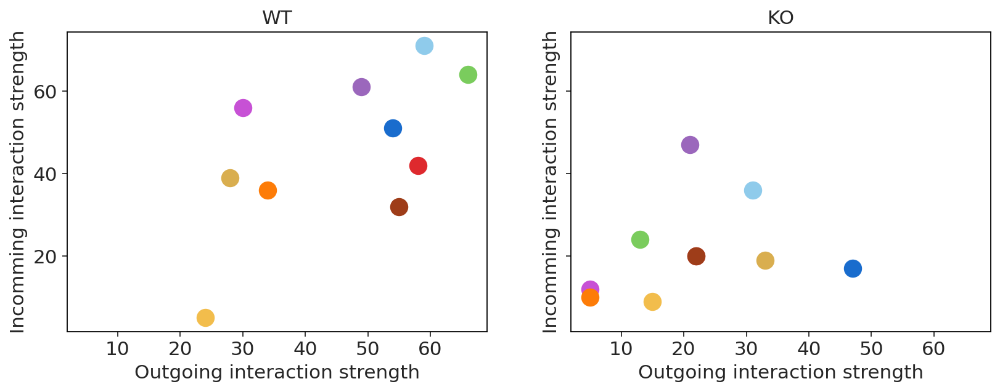

In [417]:
plt.rcParams['ytick.left'] = True  # 设置 y 轴刻度线可见
plt.rcParams['xtick.bottom'] = True  # 设置 x 轴刻度线可见
plt.rcParams['axes.edgecolor'] = 'black' 
fig,axs = plt.subplots(1,2,figsize=(12,4),sharex = True, sharey = True)
for i in celltype:
    x = wt['celltype'].tolist().index(i)
    axs[0].scatter(wt['outgoing'][x], wt['incomming'][x],s=150, color = colors[i],label = i)
    axs[1].scatter(ko['outgoing'][x], ko['incomming'][x],s=150, color = colors[i],label = i)
# axs[0].set_xlim(-0.05,0.5)
# axs[0].set_ylim(-0.05,0.45)
# axs[1].set_xlim(-0.05,0.5)
# axs[1].set_ylim(-0.05,0.45)
axs[0].set_xlabel('Outgoing interaction strength')
axs[0].set_ylabel('Incomming interaction strength')
axs[1].set_xlabel('Outgoing interaction strength')
axs[1].set_ylabel('Incomming interaction strength')
axs[0].set_title('WT')
axs[1].set_title('KO')
plt.savefig('figures/Fig7C_Prob_of_interaction_change.pdf')

In [386]:
wt['outgoing_diff'] = abs(wt['outgoing'] - ko['outgoing'])
wt['incomming_diff'] = abs(wt['incomming'] - ko['incomming'])
ko['outgoing_diff'] = abs(wt['outgoing'] - ko['outgoing'])
ko['incomming_diff'] = abs(wt['incomming'] - ko['incomming'])

wt['condition'] = 'Ctrl'
ko['condition'] = 'CKO'
wt['maincelltype'] = ['Epi','Epi','Epi','Epi','Epi','Endo','Endo','Endo','Endo','Epi']
ko['maincelltype'] = ['Epi','Epi','Epi','Epi','Epi','Endo','Endo','Endo','Endo','Epi']
dfs = pd.concat([wt,ko])

In [412]:
ctorders = ['EC_Car4+','EC_Plvap+','EC_Arterial','EC_Venous', 'AT1','AT2','Bipotential progenitors','Ciliated cells','Club cells','Neuroendocrine cells'][::-1]
dfs = pd.concat([dfs[dfs['celltype'] == u] for u in ctorders])
dfs.reset_index(inplace = True)

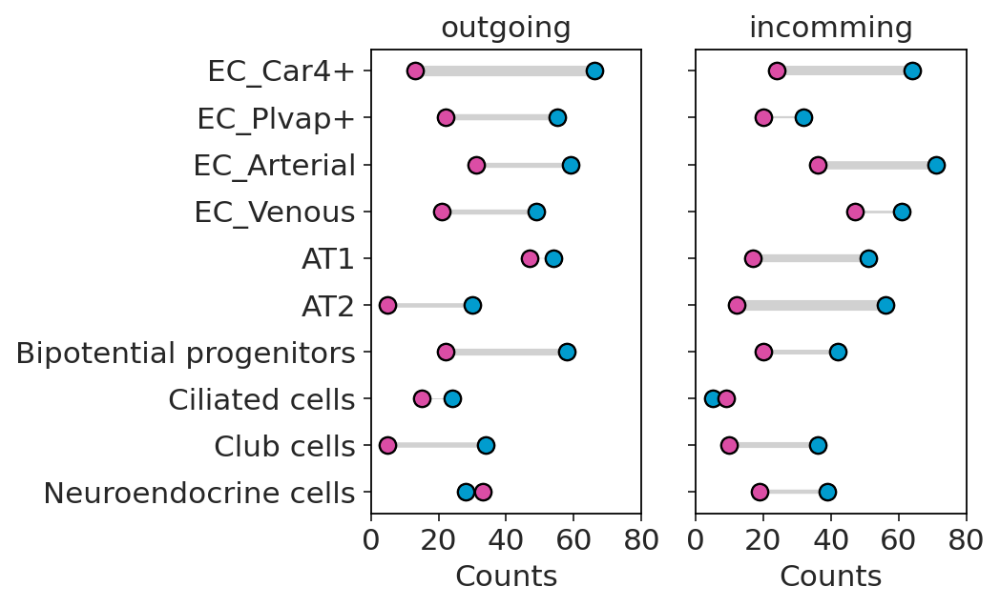

In [413]:
plt.rcParams['ytick.left'] = True  # 设置 y 轴刻度线可见
plt.rcParams['xtick.bottom'] = True  # 设置 x 轴刻度线可见
plt.rcParams['axes.edgecolor'] = 'black' 
fig,axs = plt.subplots(1,2,figsize=(5,4),sharey = True)
group = ['outgoing','incomming']
condition_colors = dict(zip(merge_adata.obs['condition'].cat.categories.tolist(),merge_adata.uns['condition_colors']))
for c in group:
    df1 = dfs[dfs['condition'] == 'Ctrl']
    df2 = dfs[dfs['condition'] == 'CKO']
    diff = df1['%s_diff'%c].values
    for i in range(df1.shape[0]):
        axs[group.index(c)].plot([df1[c].values[i],df2[c].values[i]],[df1['celltype'].values[i],df1['celltype'].values[i]],c = '#D1D1D1',linewidth=(diff[i]-min(diff))/(max(diff)-min(diff))*5,zorder = 0)
    for i in ['Ctrl','CKO']:
        df = dfs[dfs['condition'] == i]      
        axs[group.index(c)].scatter(df[c], df['celltype'], s=60, color = condition_colors[i],edgecolors='#000000',label = i)
        axs[group.index(c)].scatter(df[c], df['celltype'], s=60, color = condition_colors[i],edgecolors='#000000',label = i)
        
        # axs[group.index(c)].tick_params(axis='x', rotation=90)
        axs[group.index(c)].set_title(c)
        axs[group.index(c)].set_xticks([0,20,40,60,80])
        axs[group.index(c)].set_xlabel('Counts')
plt.savefig('figures/Fig7C_dumbbell_counts_of_interaction_change.pdf')

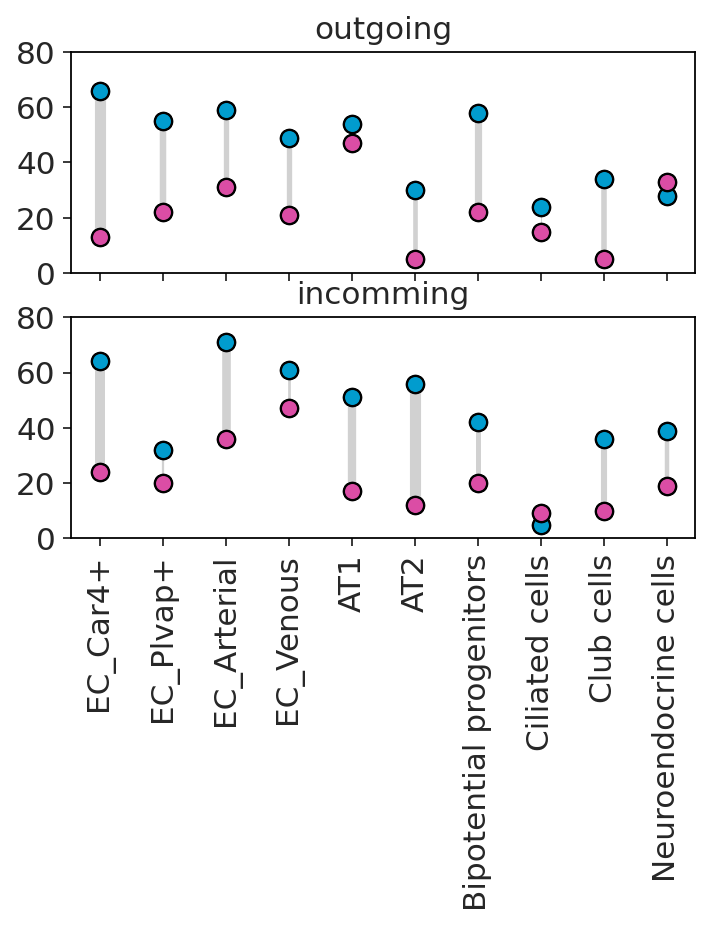

In [408]:
ctorders = ['EC_Car4+','EC_Plvap+','EC_Arterial','EC_Venous', 'AT1','AT2','Bipotential progenitors','Ciliated cells','Club cells','Neuroendocrine cells']
dfs = pd.concat([dfs[dfs['celltype'] == u] for u in ctorders])
plt.rcParams['ytick.left'] = True  # 设置 y 轴刻度线可见
plt.rcParams['xtick.bottom'] = True  # 设置 x 轴刻度线可见
plt.rcParams['axes.edgecolor'] = 'black' 
fig,axs = plt.subplots(2,1,figsize=(5,4),sharex = True)
group = ['outgoing','incomming']
condition_colors = dict(zip(merge_adata.obs['condition'].cat.categories.tolist(),merge_adata.uns['condition_colors']))
for c in group:
    df1 = dfs[dfs['condition'] == 'Ctrl']
    df2 = dfs[dfs['condition'] == 'CKO']
    diff = df1['%s_diff'%c].values
    for i in range(df1.shape[0]):
        axs[group.index(c)].plot([df1['celltype'].values[i],df1['celltype'].values[i]],[df1[c].values[i],df2[c].values[i]],c = '#D1D1D1',linewidth=(diff[i]-min(diff))/(max(diff)-min(diff))*5,zorder = 0)
    for i in ['Ctrl','CKO']:
        df = dfs[dfs['condition'] == i]      
        axs[group.index(c)].scatter(df['celltype'], df[c], s=60, color = condition_colors[i],edgecolors='#000000',label = i)
        axs[group.index(c)].scatter(df['celltype'], df[c], s=60, color = condition_colors[i],edgecolors='#000000',label = i)
        
        axs[group.index(c)].tick_params(axis='x', rotation=90)
        axs[group.index(c)].set_title(c)
        axs[group.index(c)].set_yticks([0,20,40,60,80])
        # axs[group.index(c)].set_xlabel('Counts')


# plt.savefig('figures/Fig7C_Prob_of_interaction_change.pdf')

In [522]:
ct_epi = ['AT1','AT2','Bipotential progenitors','Ciliated cells','Club cells','Neuroendocrine cells'][::-1]
ct_endo = ['EC_Car4+','EC_Plvap+','Arterial cells'][::-1]
wt.index = wt['celltype'].values
ko.index = ko['celltype'].values

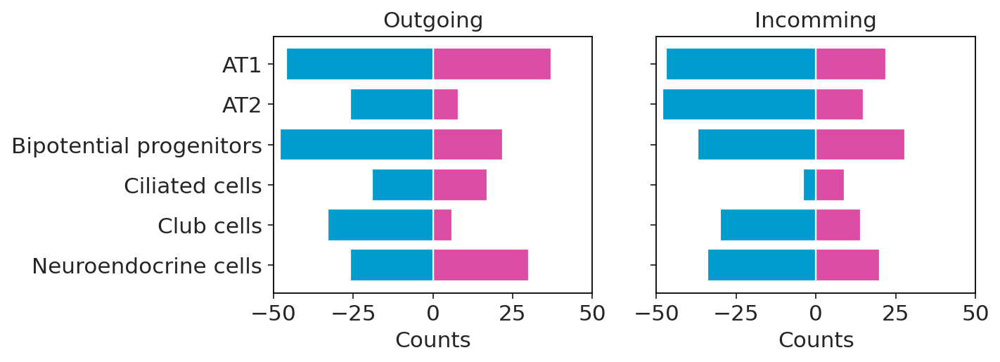

In [535]:
olim = 50
fig,axs = plt.subplots(1,2,figsize=(8,3),sharey = True, sharex=False)
for i in ct_epi:
    axs[0].barh(i, ko.loc[i,'outgoing'],color = '#DB4DA5')
    axs[0].barh(i, -wt.loc[i,'outgoing'],color = '#019CCE')
axs[0].set_xlim(-olim,olim)
axs[0].set_title('Outgoing')
ilim = 50
for i in ct_epi:
    axs[1].barh(i, ko.loc[i,'incomming'], color = '#DB4DA5',label = 'CKO')
    axs[1].barh(i, -wt.loc[i,'incomming'],color = '#019CCE',label = 'WT')
axs[1].set_xlim(-ilim,ilim)
axs[1].set_title('Incomming')
axs[0].set_xlabel('Counts')
axs[1].set_xlabel('Counts')
plt.savefig('figures/Fig7C_Epi_Bar_outgoint_incomming_counts.pdf')

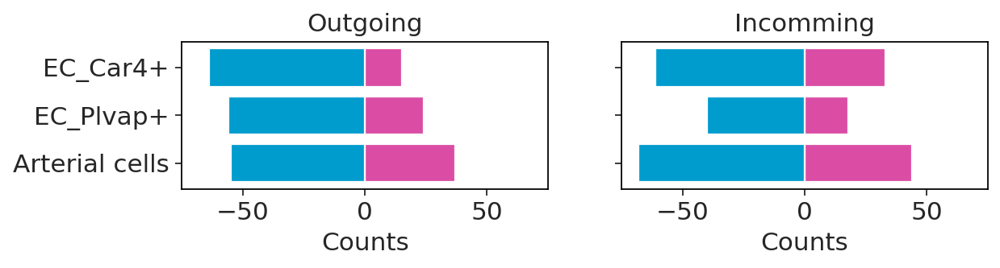

In [534]:
olim = 75
fig,axs = plt.subplots(1,2,figsize=(8,1.5),sharey = True, sharex=False)
for i in ct_endo:
    axs[0].barh(i, ko.loc[i,'outgoing'],color = '#DB4DA5')
    axs[0].barh(i, -wt.loc[i,'outgoing'],color = '#019CCE')
axs[0].set_xlim(-olim,olim)
axs[0].set_title('Outgoing')
ilim = 75
for i in ct_endo:
    axs[1].barh(i, ko.loc[i,'incomming'], color = '#DB4DA5',label = 'CKO')
    axs[1].barh(i, -wt.loc[i,'incomming'],color = '#019CCE',label = 'WT')
axs[1].set_xlim(-ilim,ilim)
axs[1].set_title('Incomming')
axs[0].set_xlabel('Counts')
axs[1].set_xlabel('Counts')
plt.savefig('figures/Fig7C_Endo_Bar_outgoint_incomming_counts.pdf')

## 10. Dotplot shows the ligand-receptor pairs

In [548]:
lr_car4 = sub_lr[(sub_lr['condition'] == 'WT')&(sub_lr['source'] == 'EC_Car4+')&(sub_lr['target'] == 'AT1')]

In [554]:
endo = merge_adata[merge_adata.obs['maincelltype'] == 'Endothelial cells']
epi = merge_adata[merge_adata.obs['maincelltype'] == 'Epithelial cells']

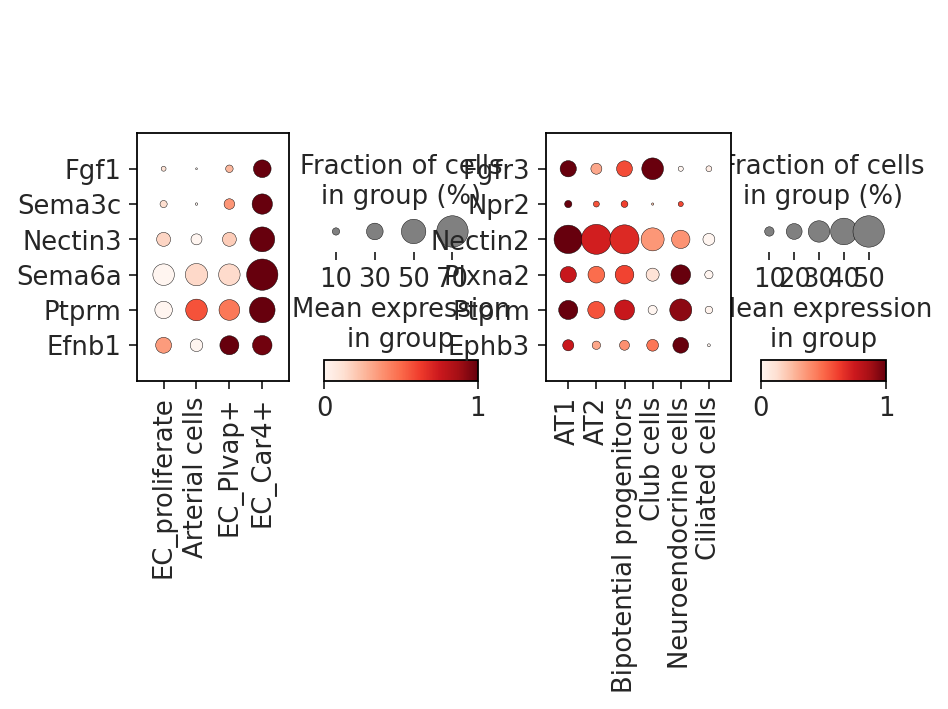

In [596]:
fig,axs = plt.subplots(1,2,figsize = (6,3))

wt_endo = endo[endo.obs['condition'] == 'WT']
wt_endo.obs['celltype'] = pd.Categorical(np.array(wt_endo.obs['celltype'] ),['EC_proliferate','Arterial cells','EC_Plvap+','EC_Car4+'])

wt_epi = epi[epi.obs['condition'] == 'WT']
wt_epi.obs['celltype'] = pd.Categorical(np.array(wt_epi.obs['celltype'] ),['AT1', 'AT2', 'Bipotential progenitors', 'Club cells','Neuroendocrine cells', 'Ciliated cells'])

sc.pl.dotplot(wt_endo,['Fgf1','Sema3c','Nectin3','Sema6a','Ptprm','Efnb1'],  "celltype", dendrogram=False,swap_axes = True,standard_scale ='var',ax=axs[0],show=False)
sc.pl.dotplot(wt_epi,['Fgfr3','Npr2','Nectin2','Plxna2','Ptprm','Ephb3'],  "celltype", dendrogram=False,swap_axes = True,standard_scale ='var',ax=axs[1],show=False)
plt.savefig('figures/Fig7C_EC_Car4_Specific_Signal.pdf')